<h1 style="text-align: center;" class="list-group-item list-group-item-action active">Phân loại đậu khô sử dụng các kĩ thuật machine learning</h1>


About dataset: <a href="https://www.muratkoklu.com/datasets/">Dry Beans</a> \
Author of dataset: Murat KOKLU, Ilker Ali OZKAN

__Attribute Information:__ \
1.) **Area (A)**: The area of a bean zone and the number of pixels within its boundaries. \
2.) **Perimeter (P)**: Bean circumference is defined as the length of its border. \
3.) **Major axis length (L)**: The distance between the ends of the longest line that can be drawn from a bean. \
4.) **Minor axis length (l)**: The longest line that can be drawn from the bean while standing perpendicular to the main axis. \
5.) **Aspect ratio (K)**: Defines the relationship between L and l. \
6.) **Eccentricity (Ec)**: Eccentricity of the ellipse having the same moments as the region. \
7.) **Convex area (C)**: Number of pixels in the smallest convex polygon that can contain the area of a bean seed. \
8.) **Equivalent diameter (Ed)**: The diameter of a circle having the same area as a bean seed area. \
9.) **Extent (Ex)**: The ratio of the pixels in the bounding box to the bean area. \
10.) **Solidity (S)**: Also known as convexity. The ratio of the pixels in the convex shell to those found in beans. \
11.) **Roundness (R)**: Calculated with the following formula: $$\frac{4*\pi*A}{P^2}$$ \
12.) **Compactness (CO)**: Measures the roundness of an object: $$\frac{E*d}{L}$$ 
13.) **ShapeFactor1 (SF1)** \
14.) **ShapeFactor2 (SF2)** \
15.) **ShapeFactor3 (SF3)** \
16.) **ShapeFactor4 (SF4)** \
17.) **Class (Seker, Barbunya, Bombay, Cali, Dermosan, Horoz and Sira)** 

<!-- <p align="center">
  <img src="/home/vtkiet/Project/Project_P4DS/final_project/image/h1.png"/>
</p> -->

![](image/h1.png)

<!-- <p align="center">
  <img src="/home/kisejin/Documents/Folder Ubuntu/code_file/noteP4DS_files/project/Dry_Bean_Dataset/final_project/image/h2.png"/> -->
<!-- </p> -->

![](image/h2.png)

<h1 style="text-align: center;" class="list-group-item list-group-item-action active">Mục lục</h1>

<a class="list-group-item list-group-item-action" data-toggle="list" href = "#1" role="tab" aria-controls="settings">1. Trích xuất thư viện<span class="badge badge-primary badge-pill"></span></a>

<a class="list-group-item list-group-item-action" data-toggle="list" href = "#2" role="tab" aria-controls="settings">2. Trích xuất dữ liệu<span class="badge badge-primary badge-pill"></span></a>

<a class="list-group-item list-group-item-action"  data-toggle="list" href="#3" role="tab" aria-controls="settings">3. Trực quan hóa dữ liệu<span class="badge badge-primary badge-pill"></span></a>

<a class="list-group-item list-group-item-action"  data-toggle="list" href="#4" role="tab" aria-controls="settings">4. Xây dựng mô hình <span class="badge badge-primary badge-pill"></span></a>

<a class="list-group-item list-group-item-action"  data-toggle="list" href="#5" role="tab" aria-controls="settings">5. Đánh giá mô hình<span class="badge badge-primary badge-pill"></span></a>

<a class="list-group-item list-group-item-action"  data-toggle="list" href="#6" role="tab" aria-controls="settings">6. Lưu trữ mô hình với tham số tối ưu và dự đoán <span class="badge badge-primary badge-pill"></span></a>

<a class="list-group-item list-group-item-action"  data-toggle="list" href="#7" role="tab" aria-controls="settings">7. Kết luận<span class="badge badge-primary badge-pill"></span></a>

<h1  style="text-align: center" class="list-group-item list-group-item-action active">1.Trích xuất thư viện</h1><a id = "1" ></a>


In [40]:
# Xử lí dữ liệu 
import pandas as pd
import numpy as np
from collections import OrderedDict

# Trực quan hóa
import ipywidgets as widgets
from IPython.core.display import HTML
import seaborn as sns
from matplotlib import pyplot as plt
import matplotlib
from mpl_toolkits.mplot3d import Axes3D

# Tiền xử lí 
from imblearn.pipeline import Pipeline as imbPipeline
from feature_engine import outliers
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from feature_engine.selection import DropCorrelatedFeatures
from sklearn.preprocessing import RobustScaler
from imblearn.over_sampling import SMOTE

# Mô hình machine learning
import pickle
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold

# Đánh giá mô hình
from sklearn.metrics import accuracy_score, f1_score, \
                            roc_auc_score, ConfusionMatrixDisplay, \
                            classification_report,\
                            precision_score, recall_score
from yellowbrick.classifier import ClassPredictionError, ConfusionMatrix, ClassificationReport

# Set path working
import os
path = '/home/kisejin/Documents/Folder Ubuntu/code_file/noteP4DS_files/project/Dry_Bean_Dataset/final_project'
os.chdir(path)

# Loại bỏ warnings
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

<h1  style="text-align: center" class="list-group-item list-group-item-action active">2.Trích xuất dữ liệu</h1><a id = "2" ></a>

In [41]:
# Đọc dữ liệu từ file excel
data = pd.read_excel('Dry_Bean_Dataset.xlsx')
data.head(5)

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [42]:
# Mô tả dữ liệu
data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [43]:
# Các loại đậu trong dữ liệu
data['Class'].unique()


array(['SEKER', 'BARBUNYA', 'BOMBAY', 'CALI', 'HOROZ', 'SIRA', 'DERMASON'],
      dtype=object)

In [44]:
# Thống kê mô tả 
data.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


<h1  style="text-align: center" class="list-group-item list-group-item-action active">3.Trực quan hóa dữ liệu</h1><a id = "3" ></a>

In [45]:
# Tham số mặc định cho đồ thị
plt.rcParams['figure.figsize'] = (10, 6)
plt.rcParams['figure.dpi'] = 300
plt.rcParams['axes.facecolor'] = '#CDE2E5'

colors = ['#49C3CB', '#7D49CB', '#FFC156', '#365C89',
          '#E9937E', '#9EE97E', '#F384BC']


In [46]:
# Trích xuất đặc trưng trong dữ liệu không bao gồm cột target
list_col = list(data.columns)
list_col.remove('Class')

# Vẽ seaborn boxplot trên matplotlib subplot với 16 đặc trưng
fig, axs = plt.subplots(8, 2, figsize=(25, 40), facecolor='#EED4CF')

# Kéo phẳng axis từ dạng ma trận sang mảng 
axs = axs.ravel()

for num, column_name in enumerate(list_col):
    sns.boxplot(x=data[column_name], y = data['Class'],
                ax=axs[num], color='skyblue')


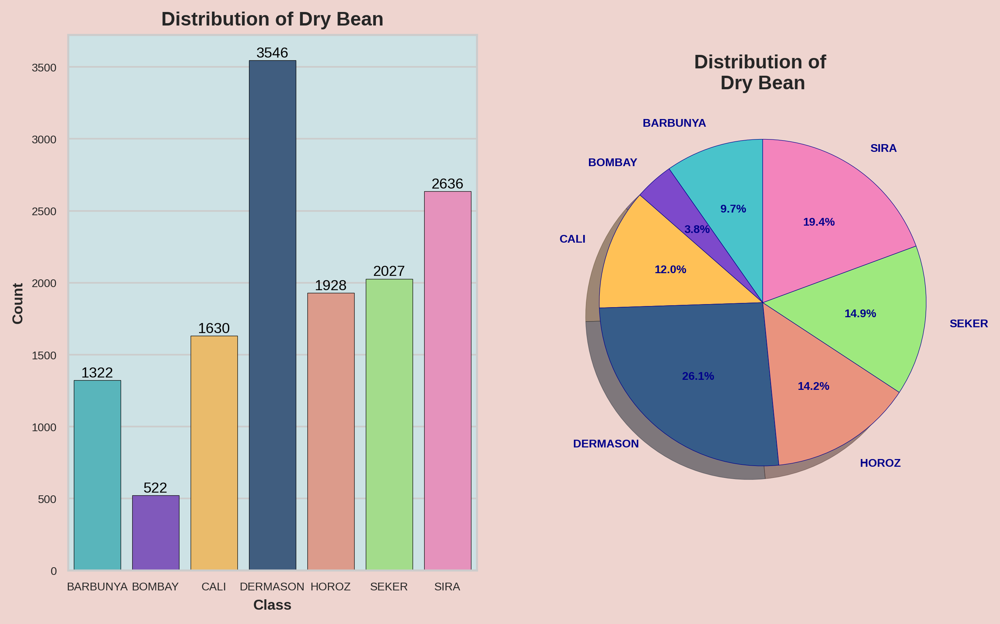

In [47]:
# Biểu đồ phân phố số lượng đậu trong dữ liệu

# Đếm số lượng class trong dữ liệu 
type_dict = data['Class'].value_counts().to_dict()
type_dict = OrderedDict(sorted(type_dict.items()))

# Trích xuất key và value của dictionary
type_label = type_dict.keys()
type_value = type_dict.values()

# Khoảng cách của mỗi pie so với tâm đường tròn.
# Giá trị 0 các pie sát vào nhau
explode = (0,)*data['Class'].nunique()

fig, ax = plt.subplots(1, 2, facecolor='#EED4CF')

# Vẽ đồ thị đếm số loại đậu trong dữ liệu
sns.countplot(data=data, x='Class', palette=colors,
              edgecolor='black', ax=ax[0], order=type_label)
ax[0].set_title('Distribution of Dry Bean', size=12, fontweight='bold')
ax[0].set_xlabel('Class', size=9, fontweight='bold')
ax[0].set_ylabel('Count', size=9, fontweight='bold')
ax[0].tick_params(axis='x', labelsize=7)
ax[0].tick_params(axis='y', labelsize=7)
ax[0].bar_label(ax[0].containers[0], fmt='%.0f', color='black', fontsize=9)

# Vẽ đồ thị chiếc bánh 
plt.pie(type_value,explode = explode ,labels=type_label, autopct='%1.1f%%',
        shadow=True, startangle=90, textprops={'fontsize': 7, 'fontweight': 'bold', 'color': 'darkblue'},  wedgeprops={'edgecolor': 'darkblue'}, colors=colors, labeldistance=1.15)
plt.title('Distribution of \nDry Bean', size=12, fontweight='bold')
plt.show()


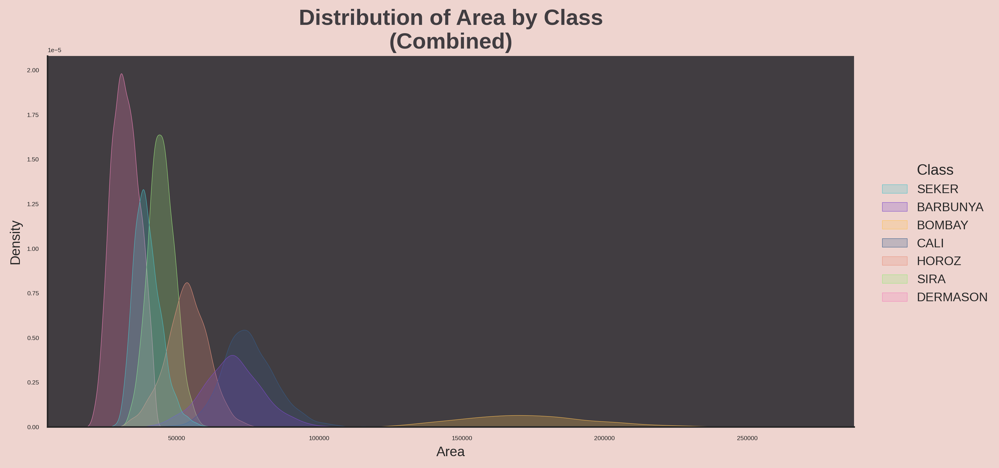

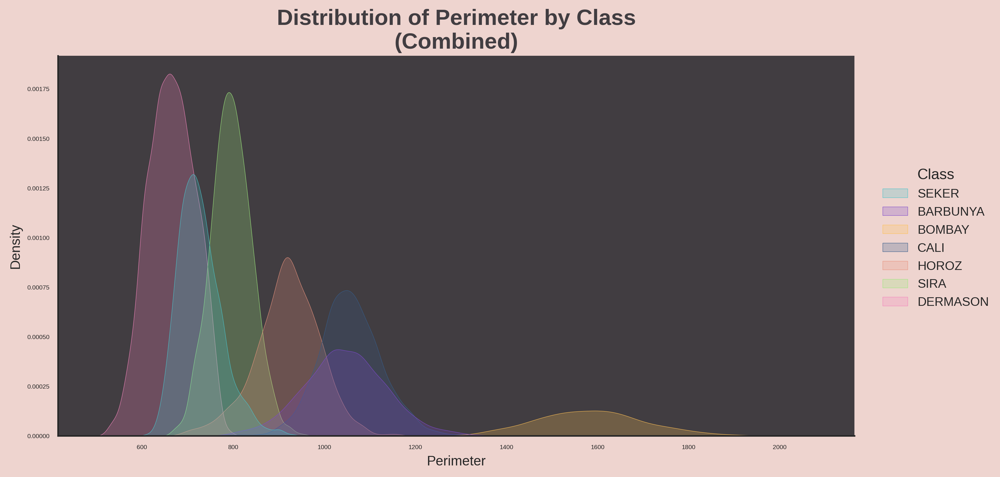

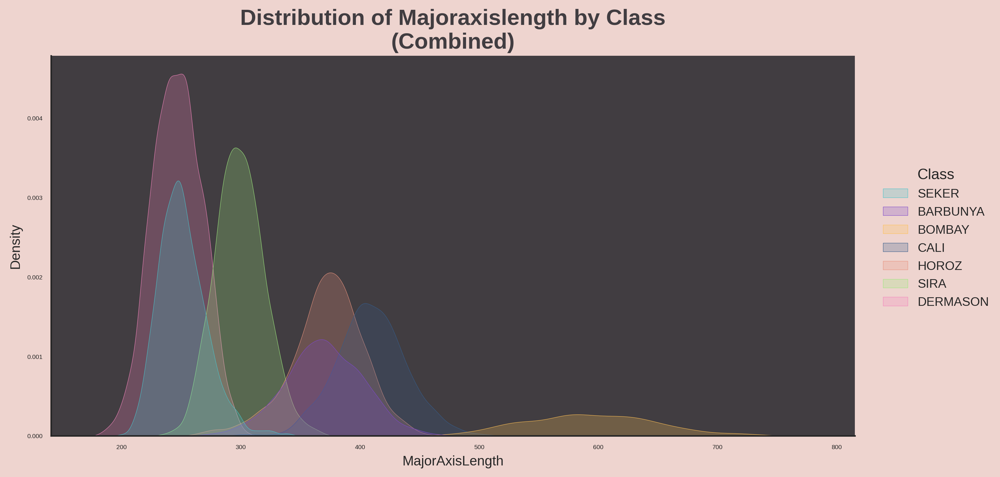

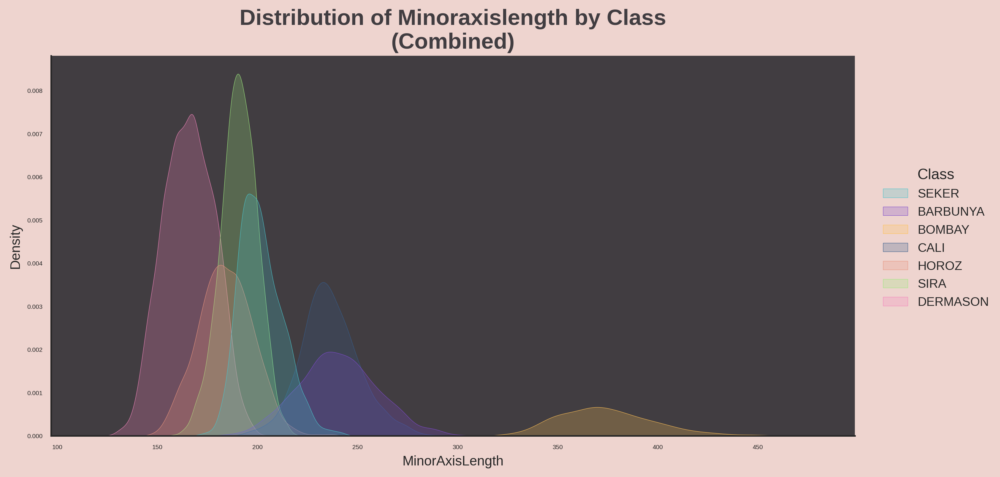

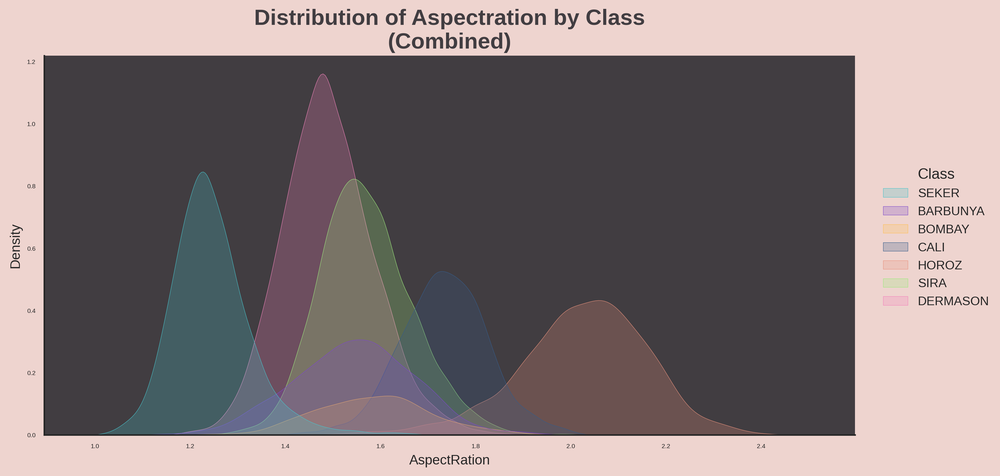

...

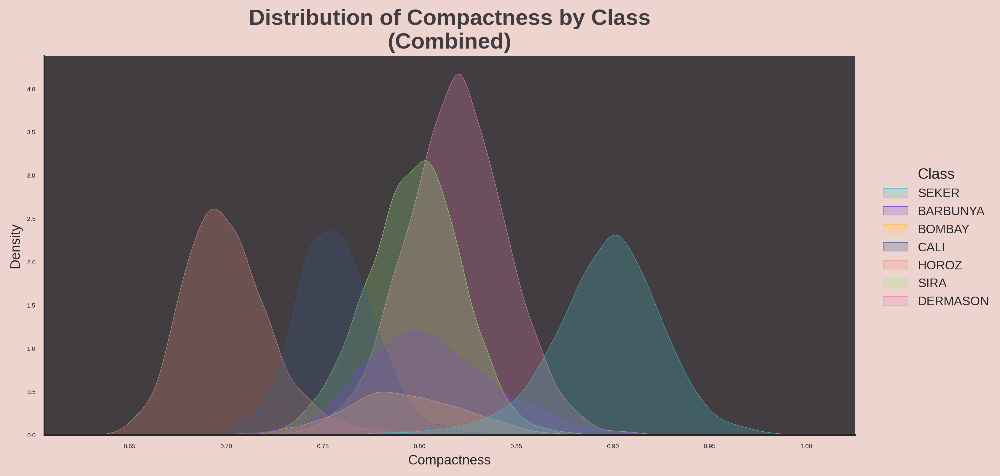

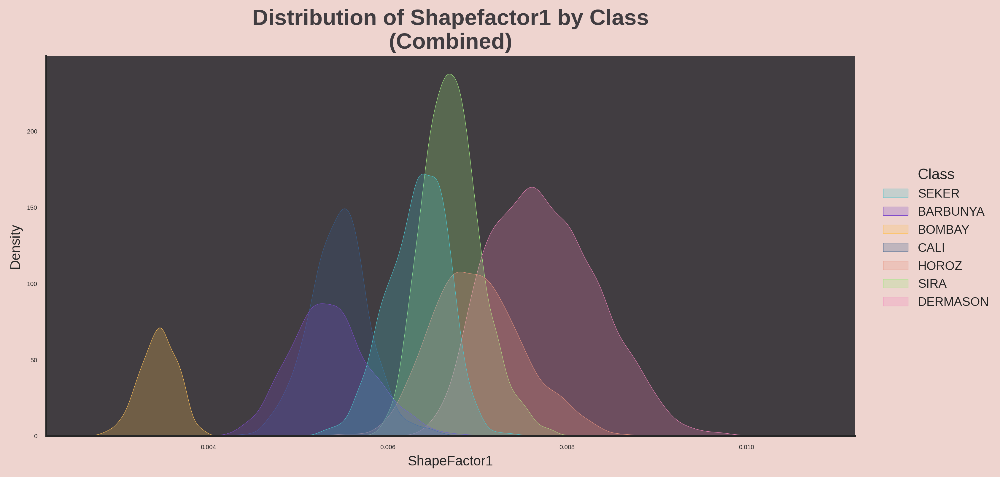

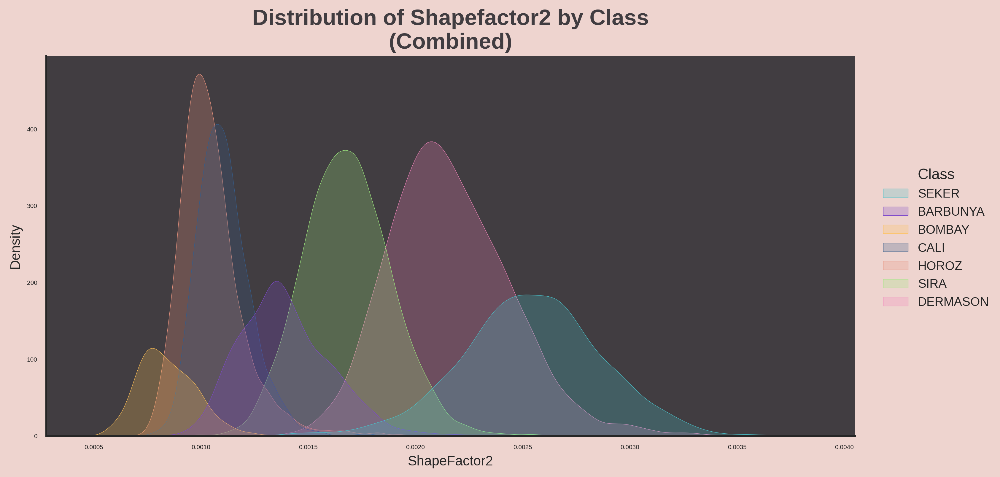

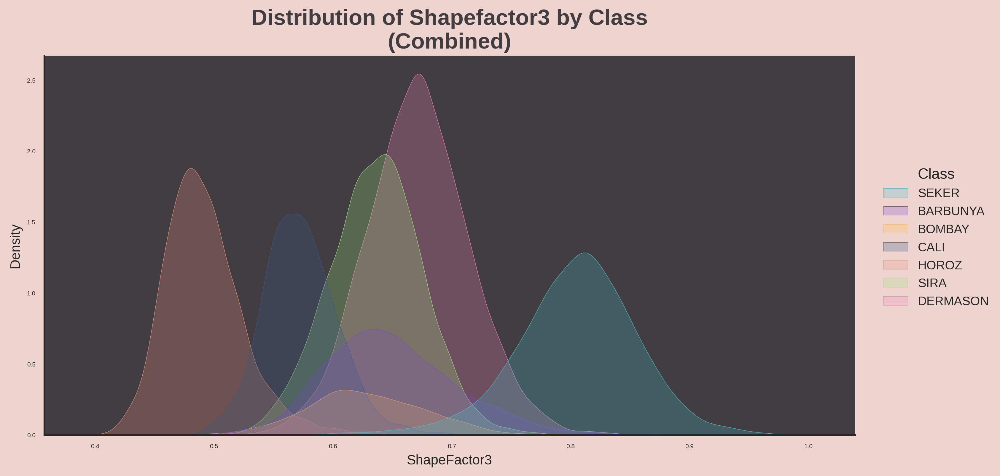

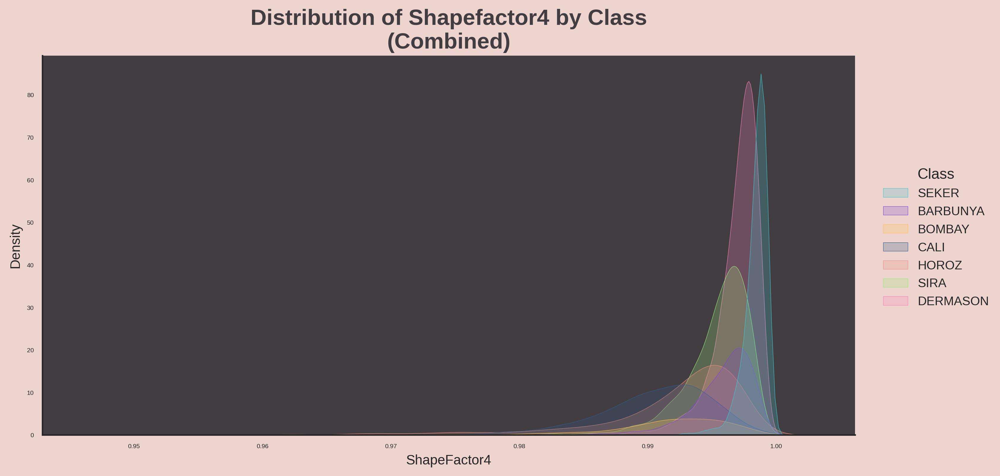

In [48]:
# Biểu đồ phân phối của các đặc trưng trong dữ liệu
  
# Lấy dữ liệu của các đặc trưng
dis_feat = data.columns[:-1]


for i in dis_feat:
    # Khung hình màu đen và background màu hồng cho mỗi hình
    with sns.axes_style('white', rc={'axes.facecolor': '#413D41', 'figure.facecolor': '#EED4CF'}):
        sns.displot(data=data, x=i, hue='Class', kind='kde', # kernel density estimate
                    palette=colors, fill=True, legend=True, aspect=2)
        plt.title('Distribution of ' + i.capitalize() + ' by Class\n(Combined)',
                  size=18, fontweight='bold', color='#413D41')


In [49]:
# Biểu đồ phân tán theo từng cặp đặc trưng trong dữ liệu 
def scatter_plot(x = 'ShapFactor1', y= 'ShapeFactor2'):
    """Vẽ biểu đồ phân tán với cặp đặc trưng khác nhau
    """
    if x == y:
        raise ValueError("Can't draw the same features together")
    plt.figure(figsize=(13,10))
    sns.scatterplot(x=data[x], y=data[y], hue=data['Class'], linewidth=0.1)
    plt.title('Scatter Plot 2D')

p1 = widgets.interact(scatter_plot, x = data.columns[:-1], y = data.columns[:-1])
plt.show()

interactive(children=(Dropdown(description='x', options=('Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLen…

In [50]:
# Biểu đồ phân tán 3D dùng 3 cặp đặc trưng
def scatter_plot3D(x = 'Area', y= 'ShapFactor1', z = 'ShapFactor2'):
    """Vẽ biểu đồ phân tán các đặc trưng đôi một khác nhau
    """
    if (x == y) or (y == z) or (x == z):
        raise ValueError("Can't draw the same features together")
    
    # Gán màu tương ứng với từng loại đậu
    colors = data['Class'].map({'SEKER': 'r', 'BARBUNYA': 'b',\
                                'BOMBAY': 'g', 'CALI': 'c', \
                                'HOROZ': 'tab:purple', 'SIRA': 'tab:brown', \
                                'DERMASON': 'm'})
    
    fig = plt.figure(figsize=(6,4))
    
    # Tạo figure không gian 3 chiều
    ax = fig.add_subplot(111, projection='3d')
    ax.scatter(data[x],data[y],data[z],c=colors)
    
    ax.set_xlabel(x)
    # Set kích thước font cho mỗi giá trị trên trục x
    plt.rc('xtick', labelsize=5)
    
    ax.set_ylabel(y)
    # Set kích thước font cho mỗi giá trị trên trục y
    plt.rc('ytick', labelsize=5)
    
    ax.set_zlabel(z)
    
    # Set kích thước font cho tựa đề của figure
    plt.rc('figure', titlesize=20)
    ax.set_title('Scatter Plot 3D')
    
    plt.show()

widgets.interact(scatter_plot3D, x = data.columns[:-1], y = data.columns[:-1], z = data.columns[:-1])


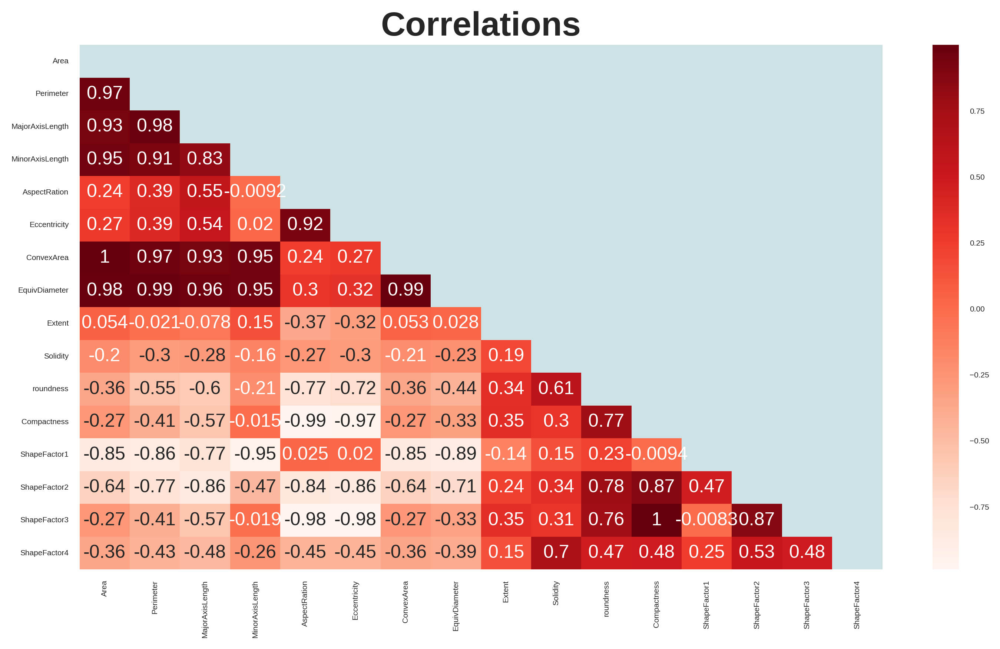

In [51]:
# Biểu đồ thể hiện mối tương quan giữa các đặc trưng trong dữ liệu 

def draw_correlation_matrix(data_corr):
    # Dùng triagle upper để tô màu background, 
    # đồng thời để lại không gian cho các giá trị hiển thị ở triagle lower
    mask = np.triu(np.ones_like(data_corr, dtype=bool))
    
    # Vẽ heatmap bằng thư viện seaborn hiển thị số và thang màu đỏ
    sns.heatmap(data_corr, mask=mask, annot=True, cmap='Reds')
    plt.title('Correlations', size=22, fontweight='bold')
    plt.tight_layout()
    
draw_correlation_matrix(data.iloc[:, :-1].corr())

<h1  style="text-align: center" class="list-group-item list-group-item-action active">4.Xây dựng mô hình </h1><a id = "4" ></a>


Roadmap thiết kế xây dựng mô hình theo 2 hướng 

<!-- <p align="center">
  <img src="/home/kisejin/Documents/Folder Ubuntu/code_file/noteP4DS_files/project/Dry_Bean_Dataset/final_project/image/roadmap1.jpg"/>
</p> -->


![](image/roadmap1.jpg)

In [52]:
class BaseMethod():
    def __init__(self, data):
        """Tập trung dữ liệu train, test và 
        các mô hình sẽ được xây dựng, BaseMethod được xem như hộp đen, 
        user sẽ không tham gia trực tiếp vào việc xử lí dữ liệu.
        """
        self.X = data.drop('Class', axis=1)
        self.y = data['Class']
        
        self.X_train, self.X_test, self.y_train, self.y_test = train_test_split(
            self.X, self.y, test_size=0.2, shuffle=True, random_state=42)
        
        self.models = {
            'rf': RandomForestClassifier(),
            'lr': LogisticRegression(),
            'knn': KNeighborsClassifier(),
            'svc': SVC()
        }
        
        self.full_name = {
            'lr': 'Logistic Regression',
            'rf': 'Random Forest',
            'knn': 'K Nearest Neighbors',
            'svc': 'Support Vector Classifier'
        }
    
    # Trực quan hóa báo cáo phân loại cho mỗi loại đậu dưới dạng hình ảnh
    def plot_classification_report(self ,model_grid ,ax):

        
        y_pred = model_grid.predict(self.X_test)
        clf_report = classification_report(
                        self.y_test, y_pred, output_dict=True)
        
        # Lấy các chỉ số precision, recall, f1-score, support: số  đậu trong 1 loại
        keys_to_plot = [key for key in clf_report.keys() if key not in (
            'accuracy', 'macro avg', 'weighted avg')]
        
        df = pd.DataFrame(clf_report, columns=keys_to_plot).T
        rows, cols = df.shape
        mask = np.zeros(df.shape)
        mask[:, cols-1] = True

        # Vẽ các chỉ số precision, recall, f1-score trước vì 3 chỉ này với support có range khác nhau,
        # mà để giữ thang mức độ phải xử lí 2 phần riếng biệt
        sns.heatmap(df, mask=mask, annot=True, cmap='RdBu', fmt='.3g',
                    vmin=0.0,
                    vmax=1.0,
                    linewidths=2, linecolor='white', ax=ax
                    )
        mask = np.zeros(df.shape)
        mask[:, :cols-1] = True

        # Vẽ chỉ số support
        sns.heatmap(df, mask=mask, annot=True, cmap='RdBu', cbar=False,
                    linewidths=2, linecolor='white', fmt='.0f',
                    vmin=df['support'].min(),
                    vmax=df['support'].sum(),
                    norm=matplotlib.colors.Normalize(vmin=df['support'].min(),
                                                     vmax=df['support'].sum()), ax=ax
                    )

        

    # Trực quan hóa dự đoán nhầm lẫn giữa các loại đậu
    def plot_prediction_error(self ,model_grid ,ax):
        visualizer = ClassPredictionError(
            model_grid, is_fitted=True, ax=ax
        )
        
        visualizer.score(self.X_test, self.y_test)

    # Trực quan hóa confusion matrix bằng thư viện yellowbrick
    def plot_confusion_matrix(self ,model_grid ,ax):
        cm = ConfusionMatrix(model_grid, is_fitted=True, ax=ax)
        cm.fit(self.X_train, self.y_train)
        cm.score(self.X_test, self.y_test)
    
    # Metric đánh giá mô hình   
    def f1_weighted_score(self):
        pass


In [53]:

class SimpleApproach(BaseMethod):
    
    def __init__(self, data, name, param=None):
        """Khởi tạo việc lưu tên mô hình, tùy ý gán tham số từ user 
        """
        super().__init__(data)
        self.name = name
        if param is not None:
            self.param = param
            self.models[self.name].set_params(**self.param)
        self.models[self.name].fit(self.X_train,self.y_train)

    # Kế thừa các phương thức ở class BaseMethod và tùy chỉnh tham số đầu vào
    def plot_classification_report(self, ax):
        ax.set_title(f'Classification resport for {self.full_name[self.name]}(Simple Approach)')
        ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(),
                      rotation=45, ha='right')
        super().plot_classification_report(self.models[self.name], ax)

    def plot_prediction_error(self ,ax):
        ax.set_title(
            f'Prediction error using {self.full_name[self.name]}(Simple Approach)').set_fontsize(20)
        super().plot_prediction_error(self.models[self.name], ax)
    
    def plot_confusion_matrix(self,ax):
        ax.set_title(f'Cofusion matrix using {self.full_name[self.name]}(Simple Approach)')
        super().plot_confusion_matrix(self.models[self.name], ax)
        
    def f1_weighted_score(self):
        pred = self.models[self.name].predict(self.X_test)
        return f1_score(self.y_test, pred, average='weighted')



In [54]:

class SequenceApproach(BaseMethod):
    def __init__(self, data, name):
        """Khởi tạo việc lưu hyperparameter và tên mô hình,
        tiền xử lí trên tập training và tìm kiếm tham số tốt cho mô hình 
        """
        super().__init__(data)
        self.name = name
        
        # Có 2 loại gán tham số:
        #       list: giữ một tham số và điểu chỉnh ở tham số còn lại 
        #               (thuận tiện khi tìm tham số  vài mô hình như logistic regression vì một vài tham số không tương thích với nhau)
        #       dictionary: lần lượt cặp tham số với nhau (mất thời gian tìm kiếm)
        self.params = {
            'rf': {
                'n_estimators': [50, 200, 500],
                'max_depth': [5, 50, 100]
            },
            'lr':
                [{'solver': ['lbfgs'], 'C':[0.1, 1, 10], 'multi_class':['ovr'], 'penalty':['l2']},
                 {'solver': ['saga'], 'C':[0.1, 1, 10], 'multi_class':['ovr'], 'penalty':['l1', 'l2']}],
            'knn': {
                'n_neighbors': range(3, 40)
            },
            'svc':
                [{'kernel': ['linear'], 'degree':[0]},
                 {'kernel': ['poly'], 'degree': [2, 3, 4]},
                 {'kernel': ['rbf'], 'degree':[0]}]
        }

        cols = self.X.columns.to_list()
        
        # Xây dựng pipeline
        pipeline_gridsearch = imbPipeline(
            steps=[('cols_drop', DropCorrelatedFeatures(threshold=0.95)),
                   ('outlier', outliers.Winsorizer(capping_method='mad')),
                   ('scaler', RobustScaler()),
                   ('smote', SMOTE()),
                   ('estimator', self.models[self.name])])

        # Vì mô hình được đóng gói trong pipeline,
        # nên việc điều chỉnh siêu tham số phải được thông qua tên gọi của mô hình trong pipeline là estimator
        # tên gọi cho việc điều chỉnh: estimator__(tham số tương ứng của mô hình) 
        # Kiểm tra nếu hyperameter là dạng list phải xét từng phần tử một
        # Ngược lại ta thay đổi key cho dictionary
        if isinstance(self.params[name], list):
            params_grid = []
            for dic in self.params[name]:
                param = {}
                for key, value in dic.items():
                    param['estimator__%s' % (key)] = value
                params_grid.append(param)
        else:
            params_grid = {}
            for param, value in self.params[self.name].items():
                params_grid['estimator__%s' % (param)] = value

        cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=10)
        self.grid = GridSearchCV(pipeline_gridsearch, param_grid=params_grid, cv=cv, scoring='f1_weighted',
                                 refit=True, return_train_score=True)
        self.grid.fit(self.X_train, self.y_train)


    # Kế thừa các phương thức ở class BaseMethod và tùy chỉnh tham số đầu vào
    def plot_classification_report(self, ax):
        ax.set_title(f'Classification resport for {self.full_name[self.name]}(Sequence Approach)')
        ax.set_xticks(ax.get_xticks(), ax.get_xticklabels(),
                      rotation=45, ha='right')
        super().plot_classification_report(self.grid, ax)

    def plot_prediction_error(self, ax):
        ax.set_title(
            f'Prediction error using {self.full_name[self.name]}(Sequence Approach)').set_fontsize(20)
        super().plot_prediction_error(self.grid, ax)

    def plot_confusion_matrix(self, ax):
        ax.set_title(f'Cofusion matrix using {self.full_name[self.name]}(Sequence Approach)')
        super().plot_confusion_matrix(self.grid, ax)

    def f1_weighted_score(self):
        return self.grid.score(self.X_test, self.y_test)

    # Thống kê các tham số tối ưu của mô hình với traning score
    def statistical_comparison_of_hyperparameters(self):
        results_df = pd.DataFrame(self.grid.cv_results_)
        results_df = results_df.sort_values(by=['rank_test_score'])
        results_df = results_df.set_index(
            results_df['params'].apply(lambda x: ', '.join(
                str(value) for value in x.values()))
        ).rename_axis(', '.join(str(key).replace('estimator__', '') for key in results_df.loc[0, 'params']))
        return results_df[['rank_test_score', 'mean_test_score', 'std_test_score']]
    


In [55]:
# Khai báo các model xây dựng
models = ['lr', 'rf', 'svc', 'knn']
results_simple = {}
results_sequence={}

# Chạy model với 2 phương pháp simple và sequence
for model in models:
    results_simple[model] = SimpleApproach(data, model)
    results_sequence[model]=SequenceApproach(data,model)



In [56]:
# Hiển thị tham số tối cho từng mô hình theo phương pháp 
for model in models: 
    print(results_sequence[model].statistical_comparison_of_hyperparameters().to_markdown())
    print('\n\n')

| C, multi_class, penalty, solver   |   rank_test_score |   mean_test_score |   std_test_score |
|:----------------------------------|------------------:|------------------:|-----------------:|
| 10, ovr, l2, lbfgs                |                 1 |          0.912552 |       0.00436069 |
| 1, ovr, l2, lbfgs                 |                 2 |          0.911323 |       0.00308315 |
| 1, ovr, l2, saga                  |                 3 |          0.911086 |       0.00204854 |
| 0.1, ovr, l1, saga                |                 4 |          0.910029 |       0.00202456 |
| 1, ovr, l1, saga                  |                 5 |          0.909813 |       0.00196089 |
| 10, ovr, l2, saga                 |                 6 |          0.909547 |       0.00295283 |
| 10, ovr, l1, saga                 |                 7 |          0.909448 |       0.00190717 |
| 0.1, ovr, l2, saga                |                 8 |          0.907531 |       0.00234307 |
| 0.1, ovr, l2, lbfgs         

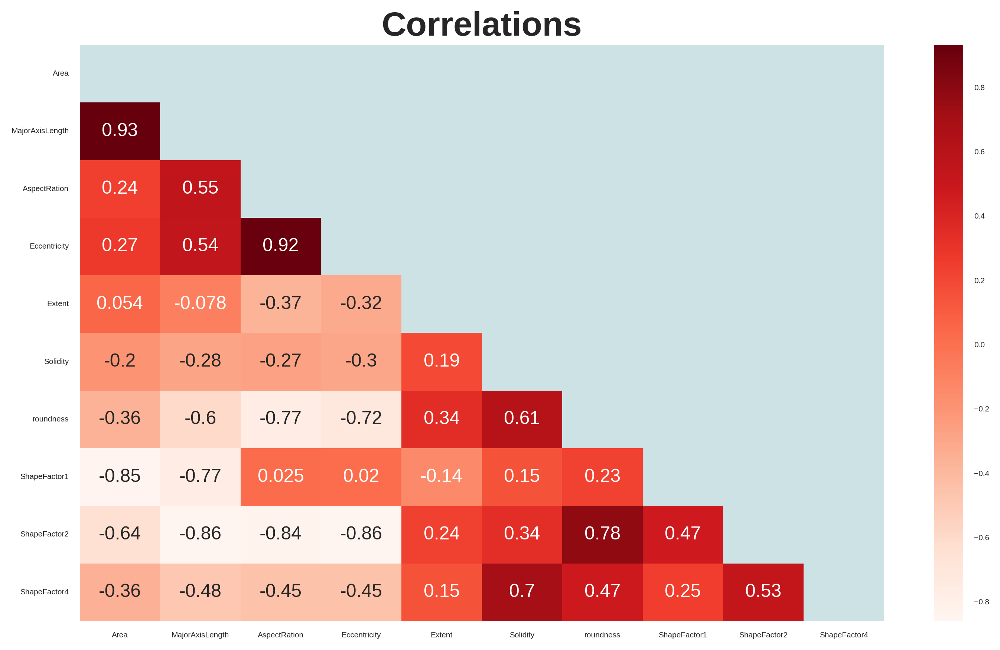

In [57]:
# Heatmap khi loại bỏ các đặc trưng có hệ số tương quan > 0.95
cols_drop = results_sequence['lr'].grid.best_estimator_['cols_drop'].features_to_drop_
draw_correlation_matrix(data.drop(cols_drop, axis = 1).iloc[:,:-1].corr())

<h1  style="text-align: center" class="list-group-item list-group-item-action active">5.Đánh giá mô hình </h1><a id = "5" ></a>

In [58]:
def my_classification_report(model, X, y):
     y_pred=model.predict(X)
     return classification_report(y, y_pred)
for model in models:
    print(f'{model}: {my_classification_report(results_simple[model].models[model],results_simple[model].X_test,results_simple[model].y_test)}')


lr:               precision    recall  f1-score   support

    BARBUNYA       0.53      0.47      0.50       261
      BOMBAY       1.00      0.98      0.99       117
        CALI       0.69      0.71      0.70       317
    DERMASON       0.77      0.85      0.81       671
       HOROZ       0.61      0.66      0.64       408
       SEKER       0.75      0.52      0.62       413
        SIRA       0.60      0.66      0.63       536

    accuracy                           0.68      2723
   macro avg       0.71      0.69      0.70      2723
weighted avg       0.69      0.68      0.68      2723

rf:               precision    recall  f1-score   support

    BARBUNYA       0.93      0.89      0.91       261
      BOMBAY       1.00      1.00      1.00       117
        CALI       0.91      0.94      0.93       317
    DERMASON       0.91      0.92      0.91       671
       HOROZ       0.97      0.96      0.96       408
       SEKER       0.96      0.94      0.95       413
        SIRA    

In [59]:
for model in models:
    print(f'{model}: {my_classification_report(results_sequence[model].grid,results_sequence[model].X_test,results_sequence[model].y_test)}')

lr:               precision    recall  f1-score   support

    BARBUNYA       0.92      0.93      0.92       261
      BOMBAY       1.00      1.00      1.00       117
        CALI       0.95      0.94      0.94       317
    DERMASON       0.93      0.87      0.90       671
       HOROZ       0.96      0.97      0.96       408
       SEKER       0.96      0.94      0.95       413
        SIRA       0.82      0.91      0.86       536

    accuracy                           0.92      2723
   macro avg       0.94      0.94      0.94      2723
weighted avg       0.92      0.92      0.92      2723

rf:               precision    recall  f1-score   support

    BARBUNYA       0.91      0.92      0.91       261
      BOMBAY       1.00      1.00      1.00       117
        CALI       0.94      0.93      0.94       317
    DERMASON       0.91      0.92      0.91       671
       HOROZ       0.97      0.96      0.96       408
       SEKER       0.95      0.94      0.95       413
        SIRA    

In [60]:
# Đánh giá mô hình xây dựng từ phương pháp simple và sequence approach theo metric F1
simple_score = []
sequence_score = []
for model in models:
    simple_score.append(results_simple[model].f1_weighted_score())
    sequence_score.append(results_sequence[model].f1_weighted_score())

df = pd.DataFrame(
    {"Simple": simple_score, 
    "Sequence":sequence_score}, index=models)
df

,Simple,Sequence
lr,0.681827,0.921828
rf,0.924513,0.925158
svc,0.597903,0.933033
knn,0.717381,0.922487


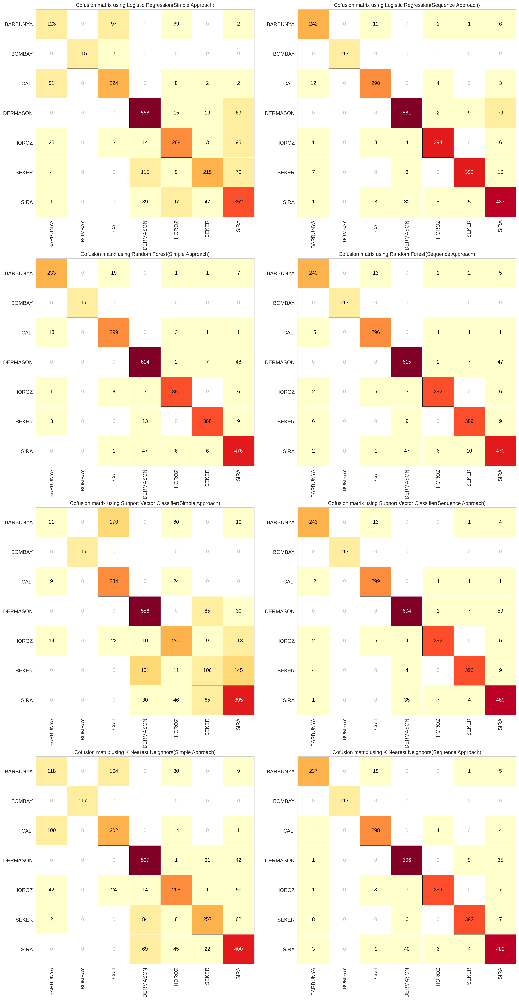

In [61]:
# Vẽ confusion matrix trên matplotlib subplots
fig, ax = plt.subplots(4, 2, figsize=(20, 40))

# Kéo phẳng axis từ dạng ma trận sang mảng 
ax = ax.ravel()

# Vẽ confusion matrix cho phương pháp simple approach với vị trí chẵn
for i, (model, result) in enumerate(results_simple.items()):
    result.plot_confusion_matrix(ax[i*2])
    
# Vẽ confusion matrix cho phương pháp sequence approach với vị trí lẻ 
for i, (model, result) in enumerate(results_sequence.items()):
    result.plot_confusion_matrix(ax[i*2+1])
plt.show()

In [62]:
# Vẽ confusion matrix trên matplotlib subplots
fig, ax = plt.subplots(4, 2, figsize=(40, 40))

# Kéo phẳng axis từ dạng ma trận sang mảng 
ax = ax.ravel()

# Vẽ confusion matrix cho phương pháp simple approach với vị trí chẵn
for i, (model, result) in enumerate(results_simple.items()):
    result.plot_prediction_error(ax[2*i])
    
# Vẽ confusion matrix cho phương pháp sequence approach với vị trí lẻ
for i, (model, result) in enumerate(results_sequence.items()):
    result.plot_prediction_error(ax[2*i+1])
plt.show()

In [63]:
# Vẽ confusion matrix trên matplotlib subplots
fig, ax = plt.subplots(4, 2, figsize=(40, 40))

# Kéo phẳng axis từ dạng ma trận sang mảng 
ax = ax.ravel()

# Vẽ confusion matrix cho phương pháp simple approach với vị trí chẵn
for i, (model, result) in enumerate(results_simple.items()):
    result.plot_classification_report(ax[2*i])
    
# Vẽ confusion matrix cho phương pháp sequence approach với vị trí lẻ
for i, (model, result) in enumerate(results_sequence.items()):
    result.plot_classification_report(ax[2*i+1])
plt.show()

<h1  style="text-align: center" class="list-group-item list-group-item-action active">6.Lưu trữ mô hình với tham số tối ưu và dự đoán  </h1><a id = "6" ></a>


In [64]:
def save_model (array_model, tail_file='.pkl'):
    """Lưu model với tham số tối ưu vào file pickle định dạng binary
    """
    for result in results_sequence.items():
        pickle.dump(result[1].grid,open(result[0] + tail_file,'wb'))

def load_model (models ,tail_file='.pkl'):
    """Load model từ file pickle đọc với định dạng binary
    """
    # Trích xuất file có đuôi pickle
    files = [model + tail_file for model in models]
    list_model = {}
    for file in files:
        list_model[file.split('.')[0]] = pickle.load(open(file, 'rb'))
    return list_model

# Save và load model trong file pickle
save_model(results_sequence)
lst = load_model (models)

In [65]:
def show_image(val):
    """Hiển thị hình ảnh từ link file
    """
    return '<img src="'+ val + '" width="100" >'
    
def predict_image (list_model, link_image, input):
    """Dự đoán từ dữ liệu được cho từ user,
    với mỗi mô hình hiển thị kết quả bằng hình ảnh
    """
    image_predict = {}
    
    # Dự đoán cho mỗi model
    for model in list_model:
        y_predict = list_model[model].predict(input)
        image_predict[model] = link_image[y_predict[0]]
        
    # Gán kết quả index: tên model và value: link ảnh dự đoán vào dataframe 
    df = pd.DataFrame.from_dict(image_predict, orient='index',columns=['Image'])
    
    # Hiển thị hình ảnh bằng HTML
    display(HTML(df.to_html(escape=False,formatters=dict(Image=show_image))))

def list_link_class (labels, link='image/'):
    """Gán link hình cho từng mô hình 
    sau khi dự đoán
    """
    link_image = {}
    for lb in labels:
        link_image[lb] = link + lb + '.png'
    return link_image

labels = data.iloc[:,-1].unique()
link_image = list_link_class (labels)

In [66]:
# Đọc dữ liệu test 
df = pd.read_csv('test.csv')

# Kiem tra voi du lieu thuoc lop DERMASON
predict_image (lst, link_image, input = df)

,Image
lr,
rf,
svc,
knn,


<h1  style="text-align: center" class="list-group-item list-group-item-action active">7.Kết luận  </h1><a id = "7" ></a>

**Về model :**  

* Giai đoạn tiền xử lý dữ liệu đóng vai trò rất quan trọng trong việc xây dựng mô hình, cũng như quyết định đến hiệu năng của mô hình 
* Với 3 mô hình là Logistic Regression, Support Vector Machine và K-nearest neighbor , hiệu năng bị ảnh hưởng rất nhiều bởi các bước tiền xử lý dữ liệu. Nguyên nhân là do 3 mô hình này sử dụng các hàm toán học dựa trên khoảng cách giữa các điểm để tính toán và đánh giá, nên việc không xử lý dữ liệu ban đầu ( dữ liệu bị nhiễu, không được chuẩn hóa, ngoại lai) dẫn đến tính toán bị sai lệch, làm điểm số sụt giảm nghiêm trọng. 
* Với random forest, mô hình không xét trên tương quan của đặc trưng mà dùng việc phân chia để quyết định kết quả nên việc tổng hợp nhiều cây làm hạn chế nhược điểm của các quyết định con.  
* Tỉ lệ thành công cao ở tất cả phương pháp đánh giá (accuracy, precision, recall, f1) cho thấy mô hình đã khá thành công trong việc phân loại các loại đậu. 
* Tất cả các mô hình đều bị nhầm lẫn khá nhiều trong việc phân loại 2 loại đậu là Sira và Demarson, điều này là bởi vì 2 loại đậu này có độ phẳng và độ tròn gần như tương đồng nhau, từ đó gây khó khăn cho việc phân loại. Nếu khắc phục được vấn đề này, điểm số của các mô hình sẽ tăng lên rất cao. 

**Về mặt hạn chế  :** 

* Qua quá trình xây dựng và đánh giá mô hình vẫn một vài khó khăn gặp phải như việc xử lí outliers cho từng loại đậu trong các đặc trưng thay vì chỉ xử lí tổng quát làm mất ý nghĩa của dữ liệu có thể thí dụ như class Bombay có kích thước to hơn so với nhóm còn lại nhưng khi xét tổng quát cho 1 đặc trưng các thông số thông kế nhận diện Bombay là những outliers. 

**Hướng phát triển trong tương lai :**  

* Khắc phục outliers bằng kĩ thuật học không giám sát (clustering) cho việc nhóm class thay vì sử dụng mặc định các class sẽ xảy ra tình huống dữ liệu mới không thuộc class nào trong dữ liệu nhưng bị nhằm lẫn do có cùng kích thước với các class (chưa có cơ sở)
* Khắc phục sự nhầm lẫn giữa hai loại đậu là Sira và Demarson bằng các thuật toán học sâu. 